In [1]:
import pandas as pd
import numpy as np
import os
import openpyxl
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from prophet import Prophet
import plotly.express as px

In [2]:
url="/home/anamaria/code/nusero92/aviation/avia_paodis__custom_9158704_spreadsheet.xlsx"

In [3]:
int_jj=pd.ExcelFile(url)

In [4]:
sheet_names_int_jj = int_jj.sheet_names[64:70]

In [5]:
dfs_int_jj = [int_jj.parse(sheet_name) for sheet_name in sheet_names_int_jj]

In [6]:
dfs_int_jj

[                   Country   2013 2014 2015 2016  2017 2018  2019 2020 2021  \
 0                  Belgium   2118   13  133   50   503    1     0    0    0   
 1                 Bulgaria     84    0    0    0     0   37     0    0    0   
 2                  Czechia      0    0    0    0     0    0     0    0    0   
 3                  Denmark      0   49  158  347   303  884   430    0    0   
 4                  Germany    228    0  283  899  3222  573  1229  412    0   
 5                  Estonia      0    0    0    0     0    0     0    0    0   
 6                  Ireland    530  154   96  118     0   90     0   72    0   
 7                   Greece      0    0    0    0     0    0     0    0    0   
 8                    Spain      0    0    0    0    57  286     0    0    0   
 9                   France   1660  159  137    0   544  285   234    0    0   
 10                 Croatia     83    0  173    0     0    0     0    0    0   
 11                   Italy      0    0 

In [7]:
base_int_jj = dfs_int_jj[0]

try:
    # Loop through the rest of the DataFrames and join them one by one, using sheet names as suffixes
    for i, df in enumerate(dfs_int_jj[1:], start=1):  # Start at 1 to include all but the first df
        # Use the sheet name for the suffix. Ensure it's a valid string that can be used as a suffix.
        sheet_name_suffix_jj = sheet_names_int_jj[i].replace(' ', '_')
        suffixes_jj = ('', f'_{sheet_name_suffix_jj}')  # Custom suffix for each joined DataFrame
        
        # Perform the merge operation and update base_df_all_ac each time
        base_int_jj = pd.merge(base_int_jj, df, on='Country', how='outer', suffixes=suffixes_jj)
except Exception as e:
    print(f"An error occurred: {e}")


In [8]:
base_int_jj.columns

Index(['Country', '2013', '2014', '2015', '2016', '2017', '2018', '2019',
       '2020', '2021', '2022', '2013_int-jj-300-499km',
       '2014_int-jj-300-499km', '2015_int-jj-300-499km',
       '2016_int-jj-300-499km', '2017_int-jj-300-499km',
       '2018_int-jj-300-499km', '2019_int-jj-300-499km',
       '2020_int-jj-300-499km', '2021_int-jj-300-499km',
       '2022_int-jj-300-499km', '2013_int-jj-500-999km',
       '2014_int-jj-500-999km', '2015_int-jj-500-999km',
       '2016_int-jj-500-999km', '2017_int-jj-500-999km',
       '2018_int-jj-500-999km', '2019_int-jj-500-999km',
       '2020_int-jj-500-999km', '2021_int-jj-500-999km',
       '2022_int-jj-500-999km', '2013_int-jj-1000-1499km',
       '2014_int-jj-1000-1499km', '2015_int-jj-1000-1499km',
       '2016_int-jj-1000-1499km', '2017_int-jj-1000-1499km',
       '2018_int-jj-1000-1499km', '2019_int-jj-1000-1499km',
       '2020_int-jj-1000-1499km', '2021_int-jj-1000-1499km',
       '2022_int-jj-1000-1499km', '2013_int-jj-1500-20

In [9]:
base_int_jj=base_int_jj.replace(":", 0)

In [10]:
base_int_jj.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36 entries, 0 to 35
Data columns (total 61 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Country                  36 non-null     object
 1   2013                     36 non-null     int64 
 2   2014                     36 non-null     int64 
 3   2015                     36 non-null     int64 
 4   2016                     36 non-null     int64 
 5   2017                     36 non-null     int64 
 6   2018                     36 non-null     int64 
 7   2019                     36 non-null     int64 
 8   2020                     36 non-null     int64 
 9   2021                     36 non-null     int64 
 10  2022                     36 non-null     int64 
 11  2013_int-jj-300-499km    36 non-null     int64 
 12  2014_int-jj-300-499km    36 non-null     int64 
 13  2015_int-jj-300-499km    36 non-null     int64 
 14  2016_int-jj-300-499km    36 non-null     int

In [11]:
base_int_jj.isna().sum()

Country               0
2013                  0
2014                  0
2015                  0
2016                  0
                     ..
2018_int-jj>2000km    0
2019_int-jj>2000km    0
2020_int-jj>2000km    0
2021_int-jj>2000km    0
2022_int-jj>2000km    0
Length: 61, dtype: int64

In [12]:
base_int_jj_melt=pd.melt(base_int_jj, id_vars=["Country"], var_name="Year_Dist", value_name="Value")
base_int_jj_melt[['Year', 'Distance']] = base_int_jj_melt["Year_Dist"].str.extract(r'(\d{4})(?:_int-jj(.*))?')


In [13]:
base_int_jj_melt=base_int_jj_melt.fillna("<300 km")

In [14]:
base_int_jj_melt.isna().sum()

Country      0
Year_Dist    0
Value        0
Year         0
Distance     0
dtype: int64

In [15]:
# Convert data types
base_int_jj_melt['Year'] = pd.to_numeric(base_int_jj_melt['Year'])
base_int_jj_melt['Value'] = pd.to_numeric(base_int_jj_melt['Value'], errors='coerce')

In [16]:
base_int_jj_melt

,Country,Year_Dist,Value,Year,Distance
0,Belgium,2013,2118,2013,<300 km
1,Bulgaria,2013,84,2013,<300 km
2,Czechia,2013,0,2013,<300 km
3,Denmark,2013,0,2013,<300 km
4,Germany,2013,228,2013,<300 km
...,...,...,...,...,...
2155,Bosnia and Herzegovina,2022_int-jj>2000km,0,2022,>2000km
2156,Montenegro,2022_int-jj>2000km,0,2022,>2000km
2157,North Macedonia,2022_int-jj>2000km,0,2022,>2000km
2158,Serbia,2022_int-jj>2000km,357,2022,>2000km


In [17]:
def plot_distance_relevance_for_each_country(df):
    """
    Plots the relevance of each distance type for each country in the DataFrame.
    
    Parameters:
    - df: DataFrame containing 'country', 'value', 'year', and 'distance' columns.
    """
    countries = df['Country'].unique()  # Get the list of unique countries
    
    for country in countries:
        # Filter the DataFrame for the current country
        country_df = df[df['Country'] == country]
        
        # Aggregate values by distance
        agg_data = country_df.groupby('Distance').agg({'Value': 'sum'}).reset_index()
        
        # Create a bar chart for the aggregated data
        fig = px.bar(agg_data,
                     x='Distance',
                     y='Value',
                     title=f'Value Distribution by Distance Type for {country}',
                     labels={'value': 'Total Value', 'distance': 'Distance Category'},
                     text='Value')
        
        # Customize the plot appearance
        fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
        fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide',
                          xaxis_tickangle=-45,  # Rotate labels for better readability
                          xaxis_title="Distance Category",
                          yaxis_title="Total Value",
                          plot_bgcolor="white")
        
        fig.show()


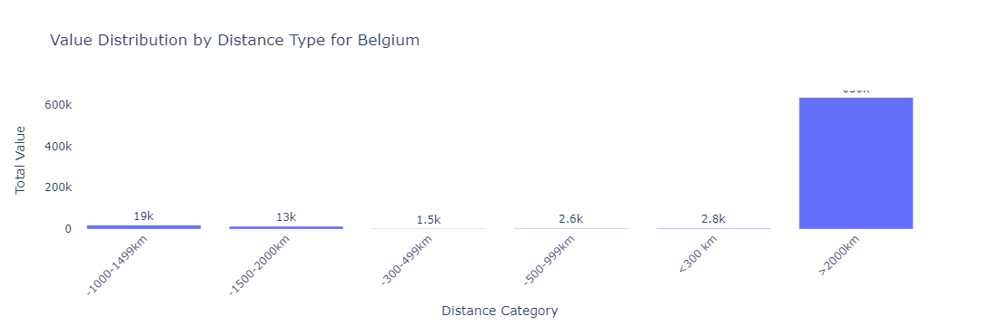

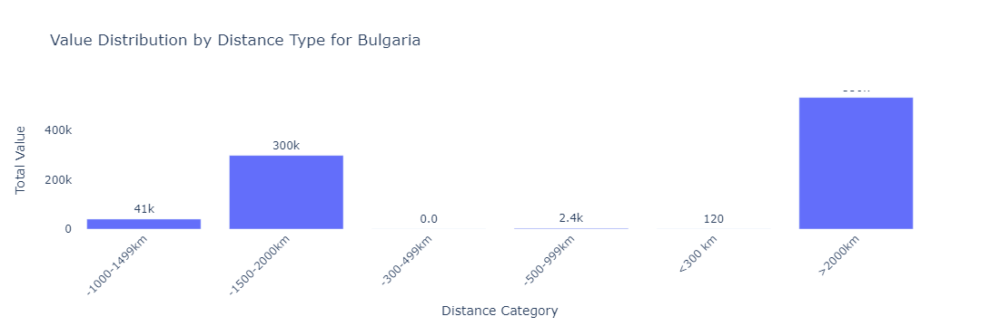

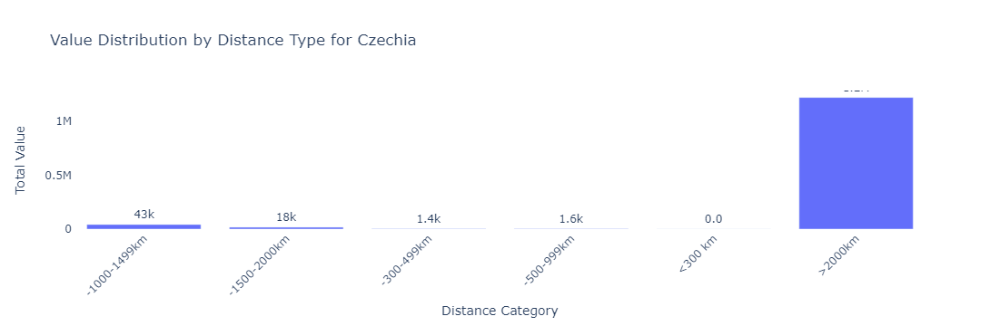

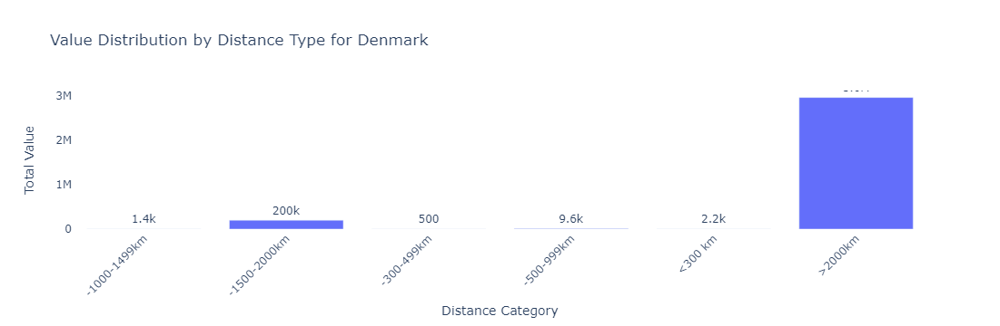

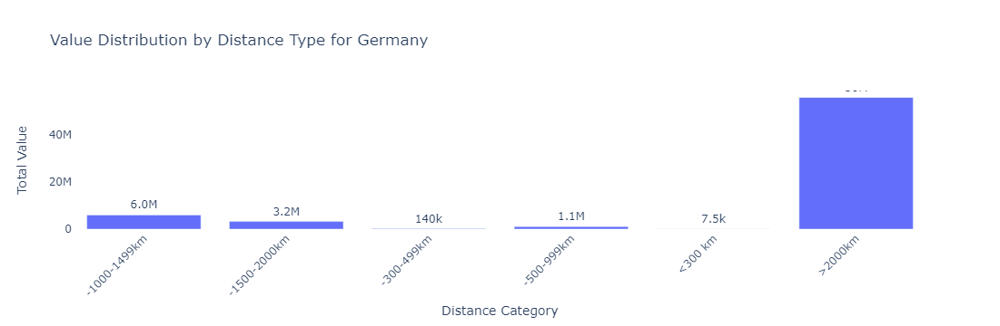

...

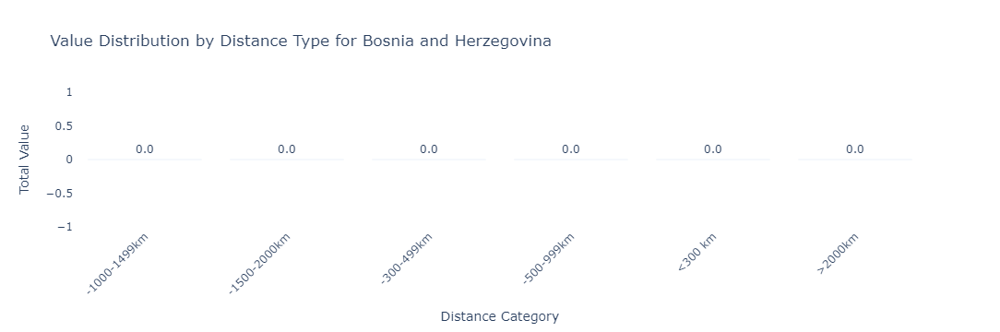

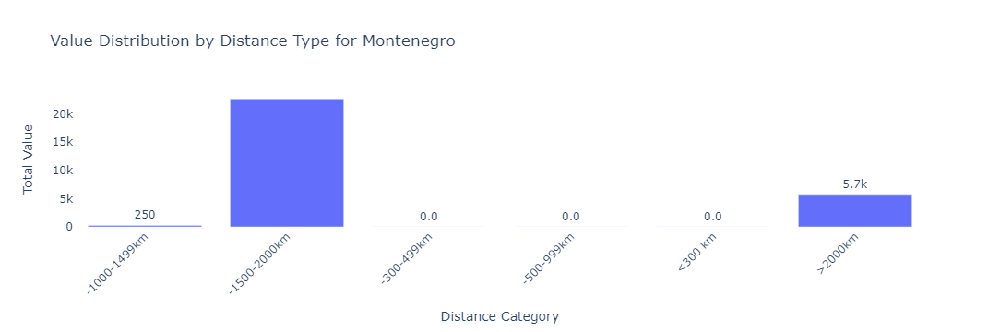

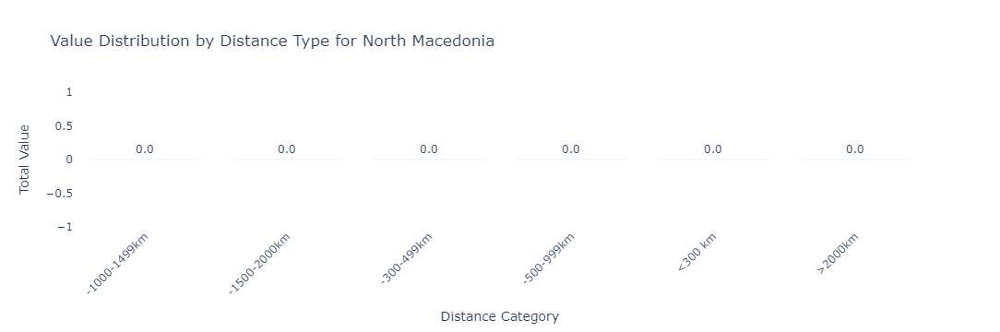

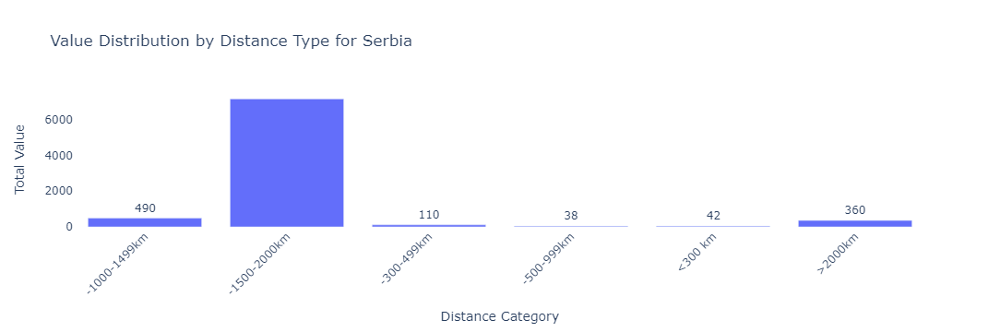

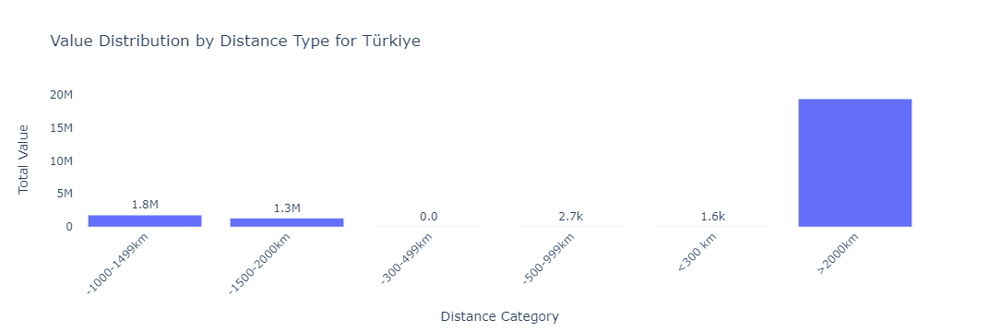

In [18]:
# Example usage with your DataFrame (assuming it's named base_int_jj_melt)
plot_distance_relevance_for_each_country(base_int_jj_melt)

In [19]:
def find_most_used_distance_by_country(df):
    """
    Finds the most used distance for each country based on the maximum aggregated value.
    
    Parameters:
    - df: DataFrame containing 'country', 'value', 'year', and 'distance' columns.
    
    Returns:
    - A DataFrame with each country and its most used distance type.
    """
    # Step 1: Aggregate values by country and distance
    agg_df = df.groupby(['Country', 'Distance'])['Value'].sum().reset_index()
    
    # Step 2: Find the distance with the maximum value for each country
    most_used_distances = agg_df.loc[agg_df.groupby('Country')['Value'].idxmax()]
    
    # Optional: Sort by country name for better readability
    most_used_distances.sort_values(by='Country', inplace=True)
    
    # Step 3: Create a list (or DataFrame) with country and its most used distance
    # If you prefer a list of tuples: [(country, distance), ...]
    most_used_list = list(zip(most_used_distances['Country'], most_used_distances['Distance']))
    
    return most_used_distances[['Country', 'Distance']]


In [20]:
# Example usage with your DataFrame (assuming it's named base_int_jj_melt)
most_used_distance_by_country_df = find_most_used_distance_by_country(base_int_jj_melt)

# If you want to see the DataFrame
most_used_distance_by_country_df


,Country,Distance
5,Austria,>2000km
11,Belgium,>2000km
12,Bosnia and Herzegovina,-1000-1499km
23,Bulgaria,>2000km
25,Croatia,-1500-2000km
35,Cyprus,>2000km
41,Czechia,>2000km
47,Denmark,>2000km
53,Estonia,>2000km
59,Finland,>2000km


In [21]:
# If you want to see the list of tuples
most_used_list = most_used_distance_by_country_df.values.tolist()
print(most_used_list)

[['Austria', '>2000km'], ['Belgium', '>2000km'], ['Bosnia and Herzegovina', '-1000-1499km'], ['Bulgaria', '>2000km'], ['Croatia', '-1500-2000km'], ['Cyprus', '>2000km'], ['Czechia', '>2000km'], ['Denmark', '>2000km'], ['Estonia', '>2000km'], ['Finland', '>2000km'], ['France', '>2000km'], ['Germany', '>2000km'], ['Greece', '>2000km'], ['Hungary', '-1500-2000km'], ['Iceland', '>2000km'], ['Ireland', '>2000km'], ['Italy', '>2000km'], ['Latvia', '>2000km'], ['Lithuania', '>2000km'], ['Luxembourg', '-1500-2000km'], ['Malta', '-1500-2000km'], ['Montenegro', '-1500-2000km'], ['Netherlands', '>2000km'], ['North Macedonia', '-1000-1499km'], ['Norway', '-1500-2000km'], ['Poland', '>2000km'], ['Portugal', '>2000km'], ['Romania', '-1500-2000km'], ['Serbia', '-1500-2000km'], ['Slovakia', '>2000km'], ['Slovenia', '>2000km'], ['Spain', '>2000km'], ['Sweden', '>2000km'], ['Switzerland', '>2000km'], ['Türkiye', '>2000km'], ['United Kingdom', '>2000km']]


In [22]:
print(base_int_jj_melt['Year'].head())  # Check the first few rows to see the values
print(base_int_jj_melt['Year'].dtype)   # Check the data type of the 'year' column


0    2013
1    2013
2    2013
3    2013
4    2013
Name: Year, dtype: int64
int64


In [23]:
import plotly.express as px
from sklearn.linear_model import LinearRegression
import numpy as np

def predict_and_plot_for_distance_types_5_years(df):
    results = []
    countries = df['Country'].unique()
    distance_types = df['Distance'].dropna().unique()

    for country in countries:
        for distance in distance_types:
            subset = df[(df['Country'] == country) & (df['Distance'] == distance)]
            
            if len(subset) > 1:
                X = subset['Year'].values.reshape(-1, 1)  # Ensure it's a 2D array
                y = subset['Value'].values
                
                model = LinearRegression()
                model.fit(X, y)
                
                # Generating future years for prediction
                last_year = X.max()
                future_years = np.array([[year] for year in range(last_year + 1, last_year + 6)])
                predictions = model.predict(future_years)
                
                # Store results
                for year, pred in zip(future_years.flatten(), predictions.flatten()):
                    results.append({'Country': country, 'Distance': distance, 'Year': year, 'predicted_value': pred})
                
                # Plotting
                # Create a DataFrame for plotting both actual and predicted data
                plot_data = pd.DataFrame({
                    'Year': np.concatenate((subset['Year'], future_years.flatten())),
                    'Value': np.concatenate((y, predictions.flatten())),
                    'Type': ['Actual']*len(y) + ['Predicted']*len(predictions)
                })
                
                # Use Plotly Express to plot
                fig = px.line(plot_data, x='Year', y='Value', color='Type', 
                              line_dash='Type',  # Differentiates line styles between actual and predicted
                              color_discrete_map={'Actual': '#636363', 'Predicted': '#A9A9A9'},
                              title=f'Prediction for {country} - {distance} for the Next 5 Years',
                              labels={'Value': 'Value', 'Year': 'Year'})
                
                # Customize the plot to use shades of grey
                fig.update_layout(
                    template='plotly_white',  # Starting template
                    plot_bgcolor='rgba(248,248,248,1)',  # Light grey background
                    paper_bgcolor='rgba(233,233,233,1)',  # Slightly different grey for contrast
                    font=dict(family="Arial, sans-serif", size=12, color='black'),  # Black font for readability
                    legend_title='Type'
                )
                
                fig.show()
                
    return pd.DataFrame(results)


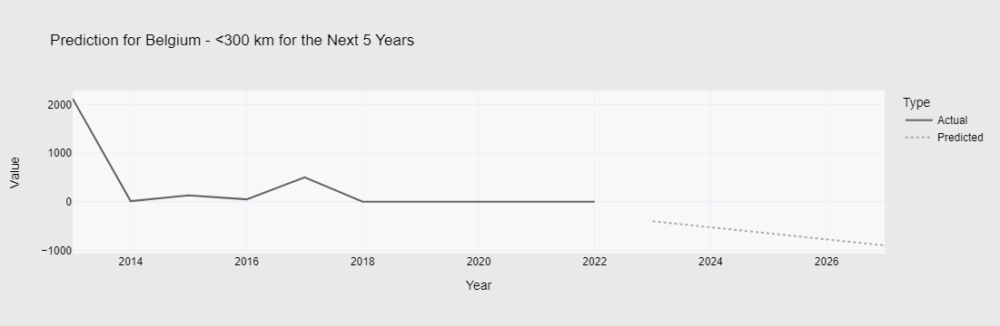

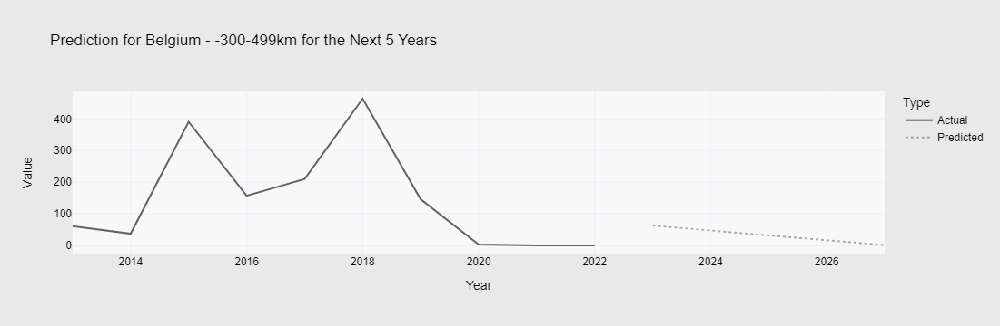

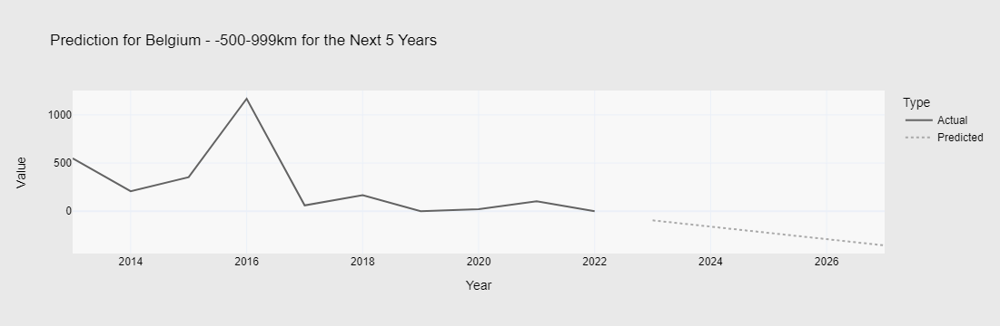

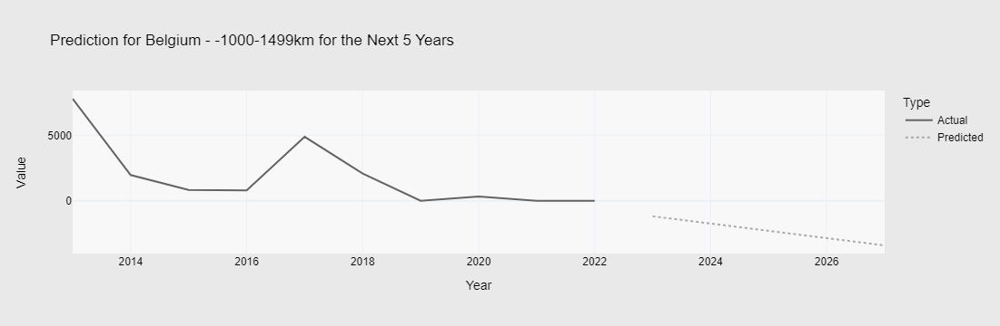

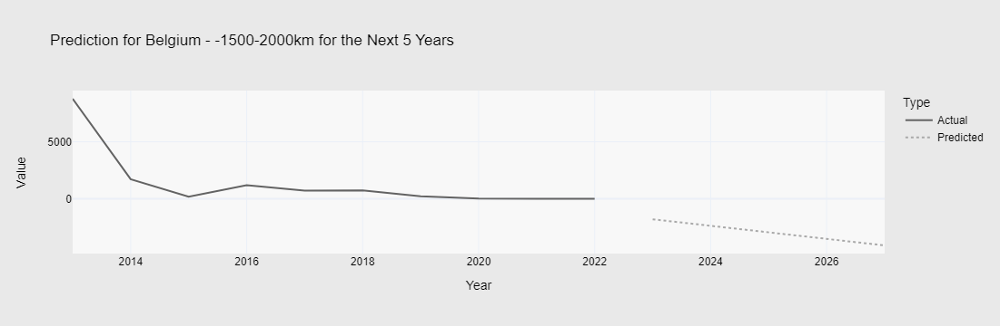

...

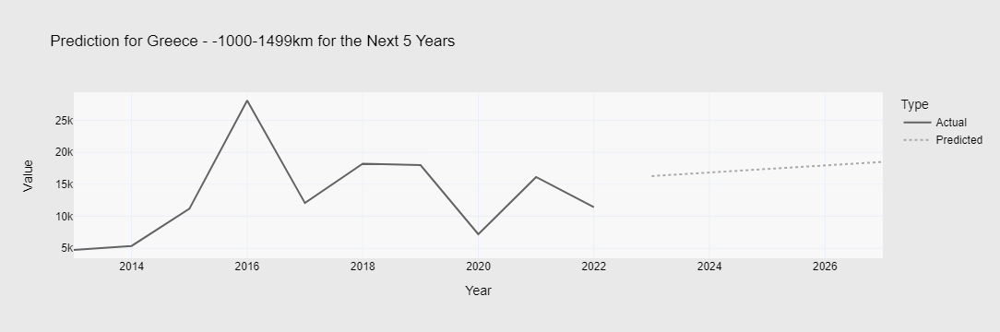

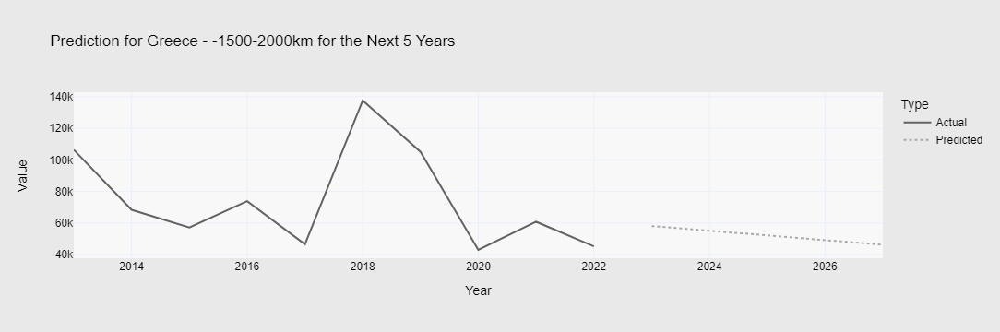

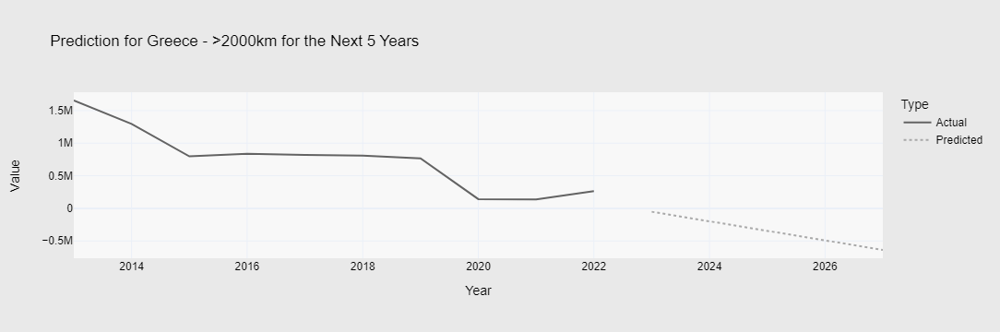

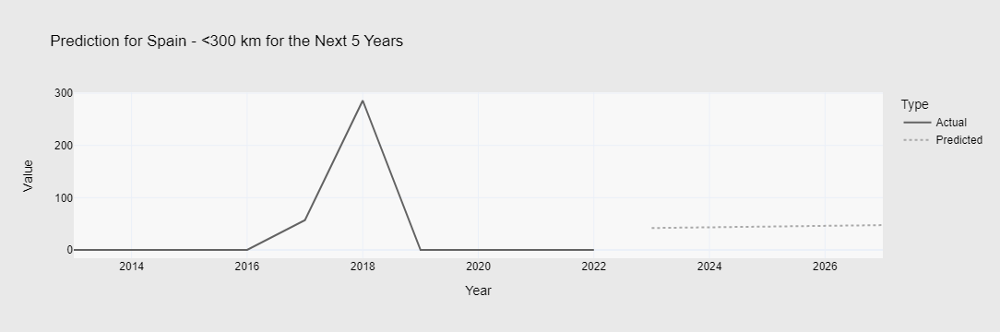

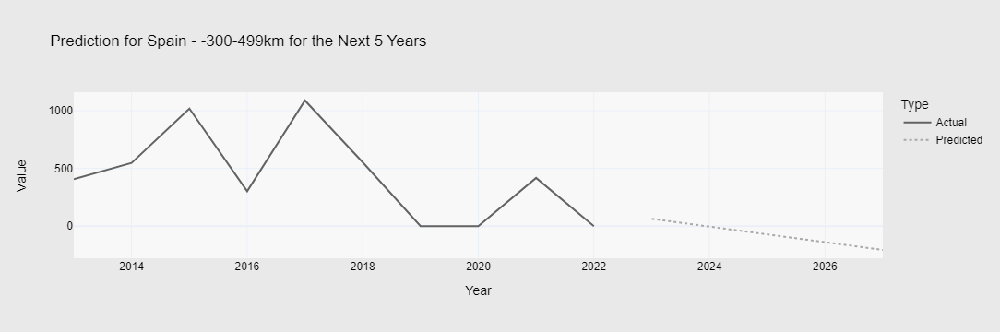

In [24]:
# Example usage
prediction_results = predict_and_plot_for_distance_types_5_years(base_int_jj_melt)